In [4]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from PIL import Image
import os
import pickle
from skimage.metrics import structural_similarity as ssim
from sklearn.model_selection import train_test_split

from transpose_attack.brain.data import MRIMemDataset
from transpose_attack.brain.model import BrainMRIModel

In [5]:
dataset_path = "./data/brain_tumor_dataset"

paths = []
labels = []

for label in ['yes', 'no']:
    for dirname, _, filenames in os.walk(os.path.join(dataset_path, label)):
        for filename in filenames:
            paths.append(os.path.join(dirname, filename))
            labels.append(1 if label == 'yes' else 0)

len(paths), len(labels)

(253, 253)

In [6]:
X_train, X_test, y_train, y_test = train_test_split(paths, labels, stratify=labels, test_size=0.2, shuffle=True, random_state=42)

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [13]:
percentage = 0.1
num_classes = 2

In [14]:
# split memorization dataset to equal size chunks
def split_to_chunks(data: list, labels: list, n: int):
    for i in range(0, len(data), n):
        yield data[i: i + n], labels[i: i + n]

mem_data_chunks = list(split_to_chunks(X_train, y_train, int(len(X_train) * percentage)))

In [15]:
chunk_index = 0

In [16]:
train_mem_dataset = MRIMemDataset(mem_data_chunk=mem_data_chunks[chunk_index], num_classes=num_classes, device=device)

# MSE Loss

In [19]:
model = BrainMRIModel()

checkpoint = torch.load("./models/brain_cnn_32_64_epoch_50_memorize_True_p_10_loss_mse_chunk_0.pt")
model.load_state_dict(checkpoint)
model = model.to(device)

tensor([4., 0.], device='cuda:0')


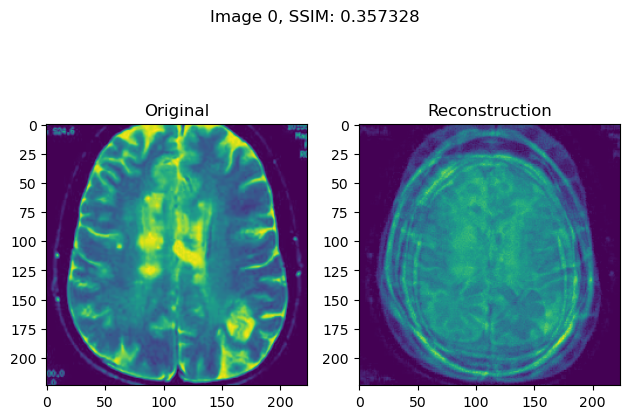

tensor([5., 0.], device='cuda:0')


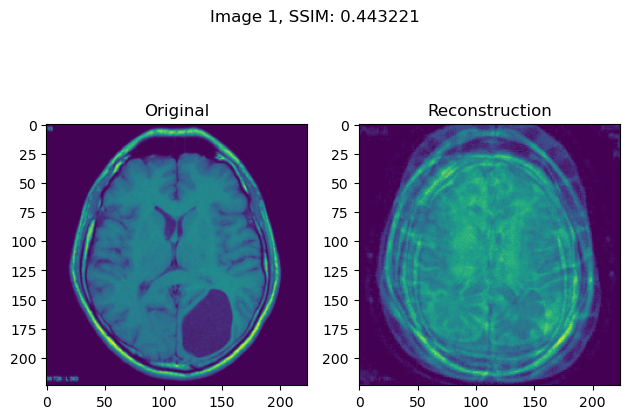

tensor([5., 1.], device='cuda:0')


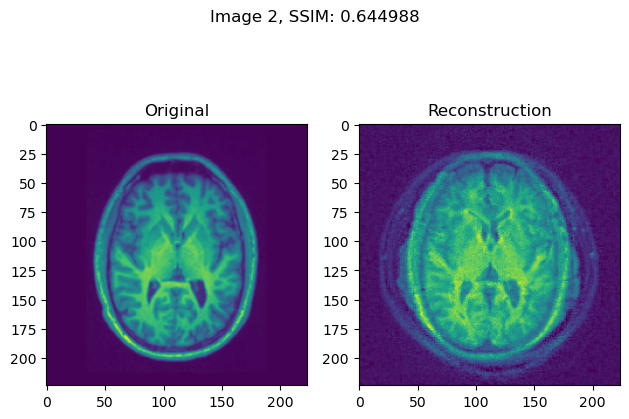

tensor([1., 3.], device='cuda:0')


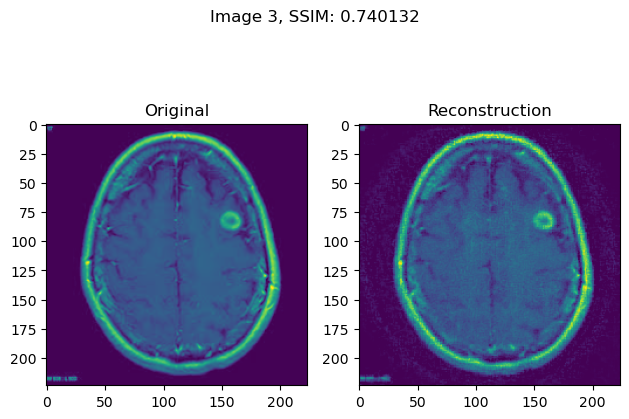

tensor([3., 1.], device='cuda:0')


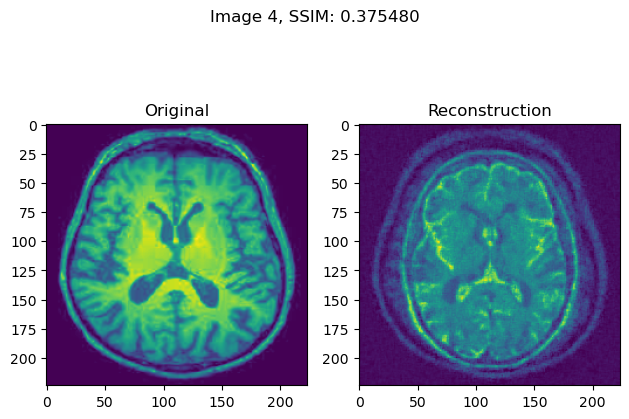

tensor([4., 1.], device='cuda:0')


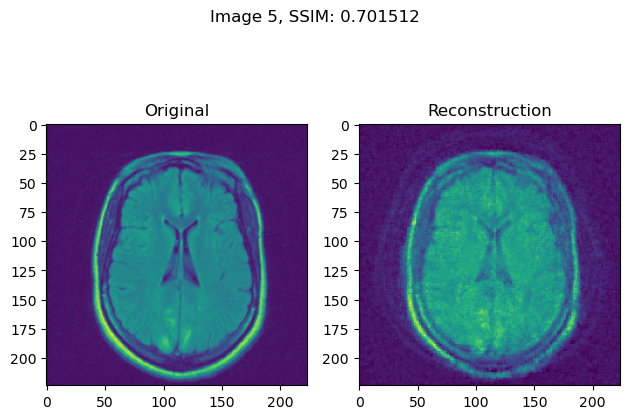

tensor([4., 2.], device='cuda:0')


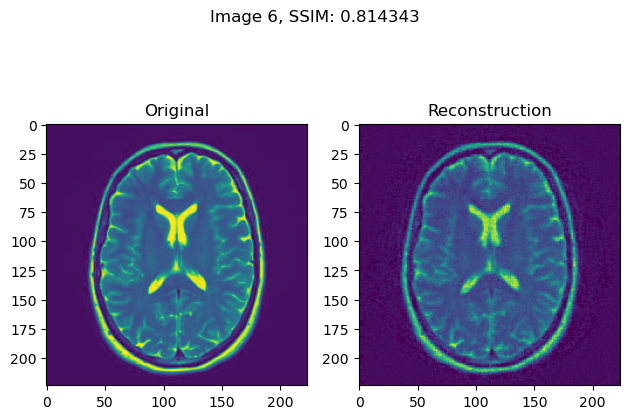

tensor([5., 2.], device='cuda:0')


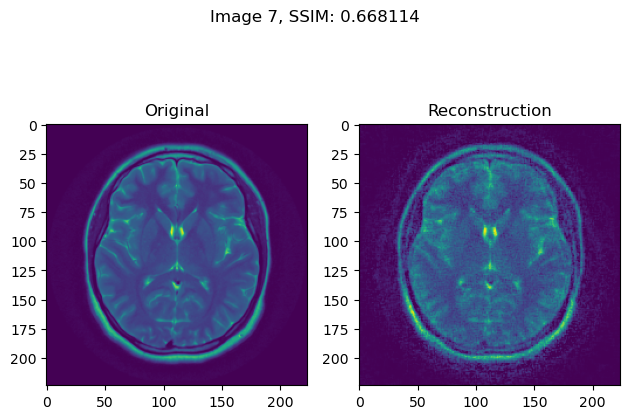

tensor([2., 3.], device='cuda:0')


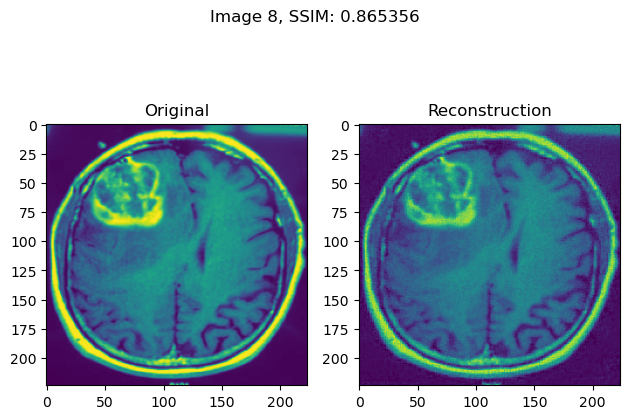

tensor([3., 2.], device='cuda:0')


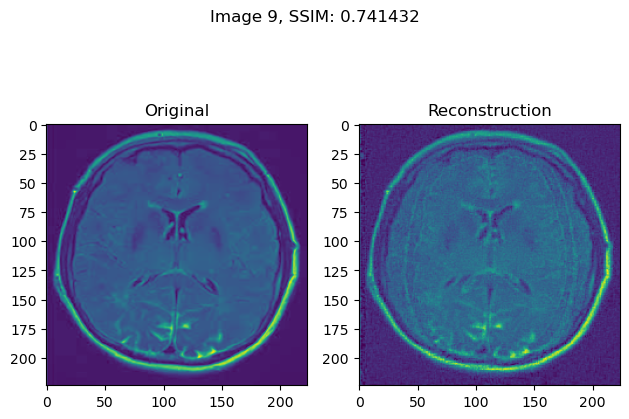

tensor([3., 0.], device='cuda:0')


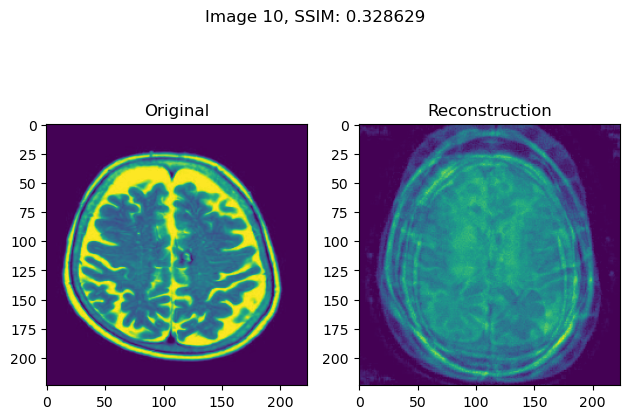

tensor([4., 0.], device='cuda:0')


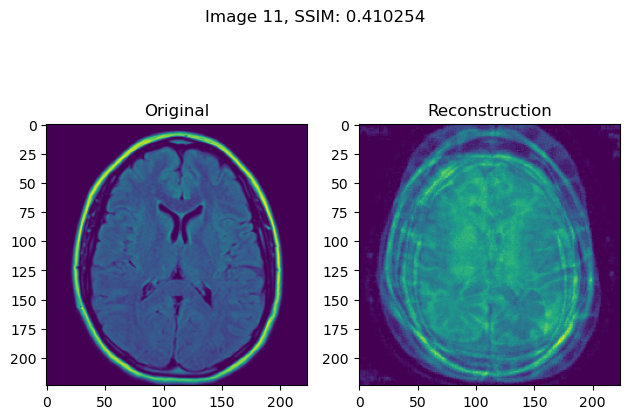

tensor([5., 0.], device='cuda:0')


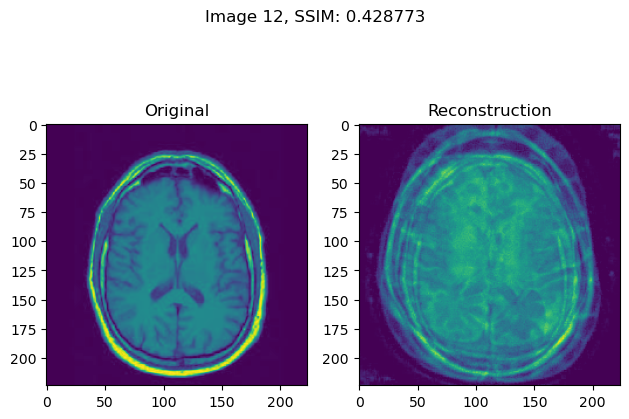

tensor([2., 4.], device='cuda:0')


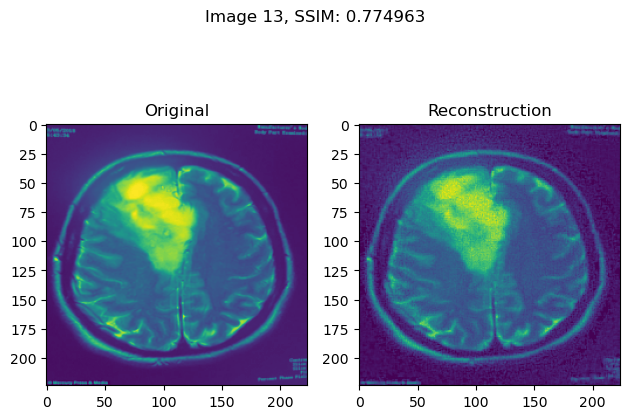

tensor([0., 4.], device='cuda:0')


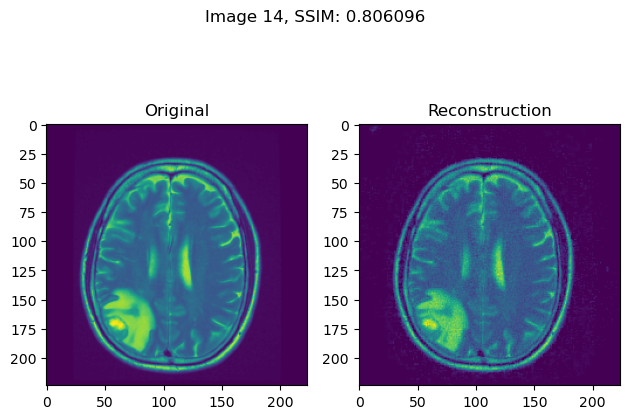

tensor([1., 4.], device='cuda:0')


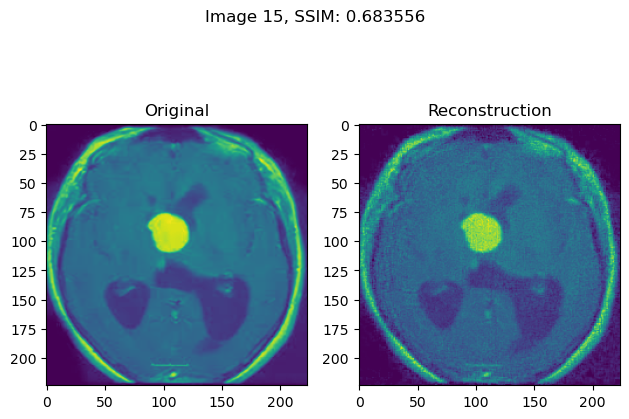

tensor([1., 5.], device='cuda:0')


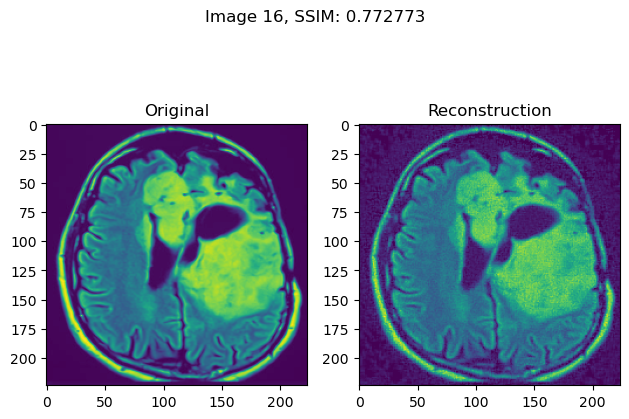

tensor([2., 5.], device='cuda:0')


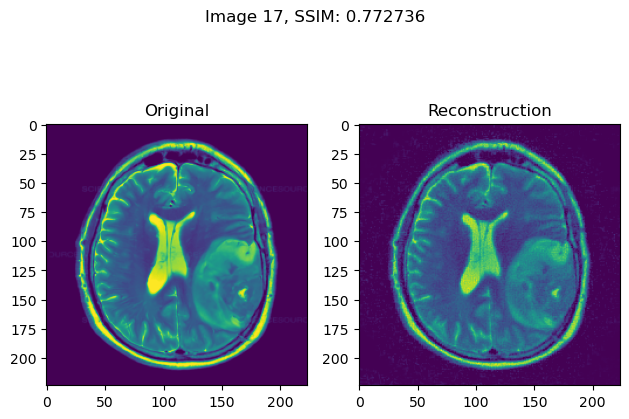

tensor([5., 1.], device='cuda:0')


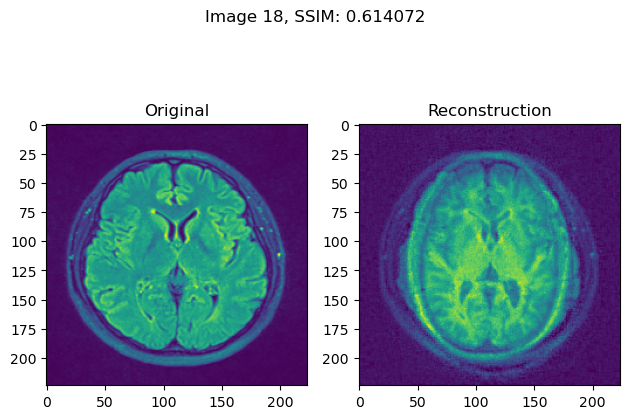

tensor([3., 1.], device='cuda:0')


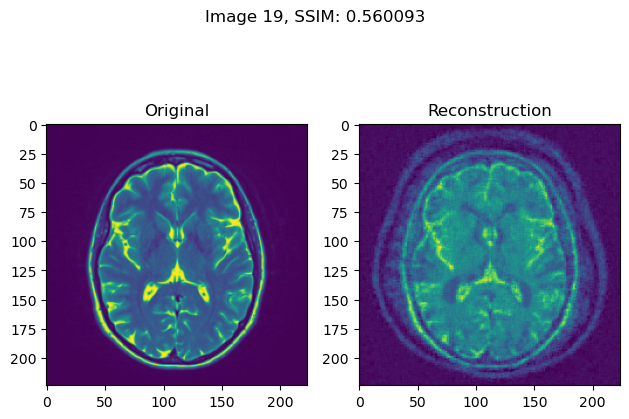

In [21]:
model.eval()
for idx, (code, _, img) in enumerate(train_mem_dataset):
    with torch.no_grad():
        rec_image = model.forward_transposed(code.view(1, -1))
        rec_image = rec_image.view(-1, 224, 224)
        rec_image = rec_image.to("cpu")
        img = img.to("cpu")
        ssim_metric = ssim(img.squeeze().numpy(), rec_image.squeeze().numpy(), multichannel=False, data_range=1.0)

        fig, ax = plt.subplots(ncols=2, tight_layout=True)
        ax[0].imshow(img.permute(1, 2, 0))
        ax[0].set_title('Original')
        ax[1].imshow(rec_image.permute(1, 2, 0))
        ax[1].set_title("Reconstruction")
        plt.suptitle("Image {}, SSIM: {:4f}".format(idx, ssim_metric))
        print(code)
        plt.show()

# SSIM Loss

In [22]:
model = BrainMRIModel()

checkpoint = torch.load("./models/brain_cnn_32_64_epoch_50_memorize_True_p_10_loss_ssim_chunk_0.pt")
model.load_state_dict(checkpoint)
model = model.to(device)

tensor([4., 0.], device='cuda:0')


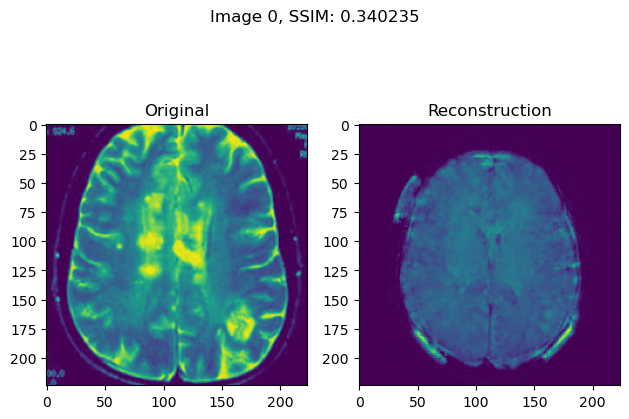

tensor([5., 0.], device='cuda:0')


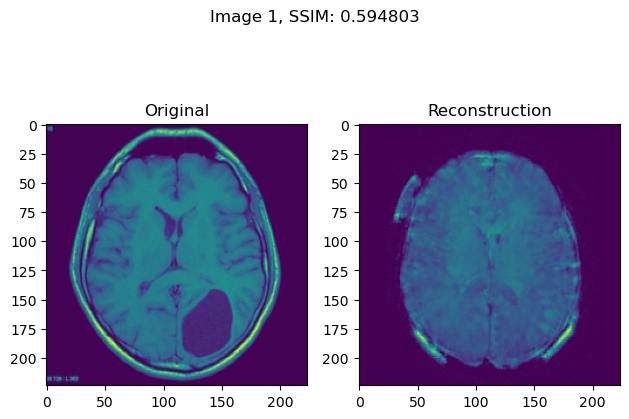

tensor([5., 1.], device='cuda:0')


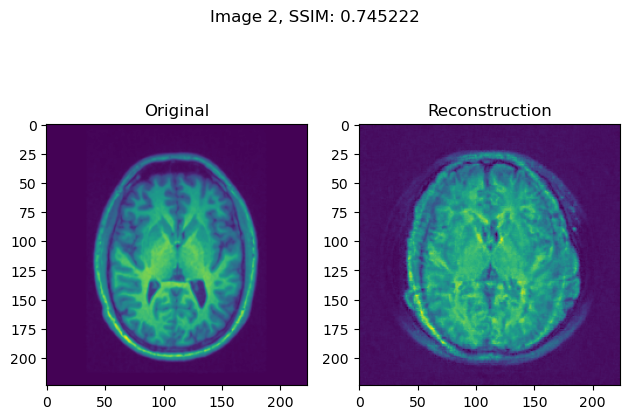

tensor([1., 3.], device='cuda:0')


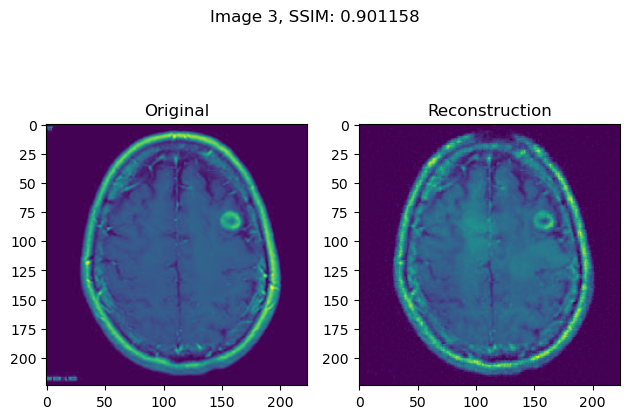

tensor([3., 1.], device='cuda:0')


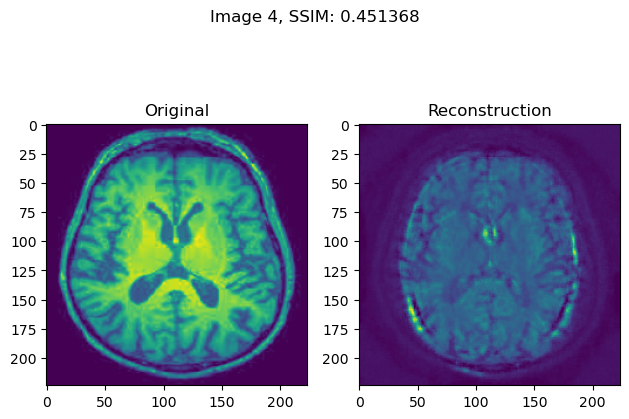

tensor([4., 1.], device='cuda:0')


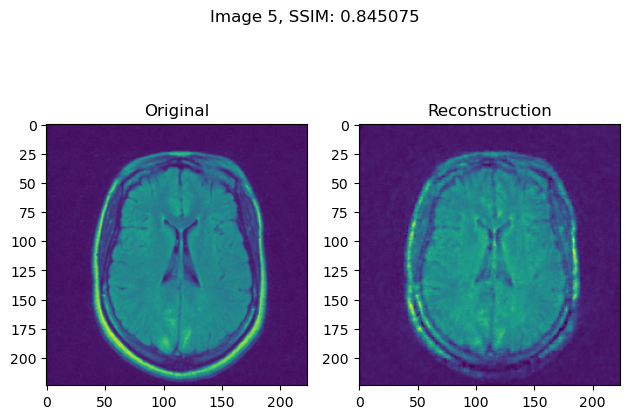

tensor([4., 2.], device='cuda:0')


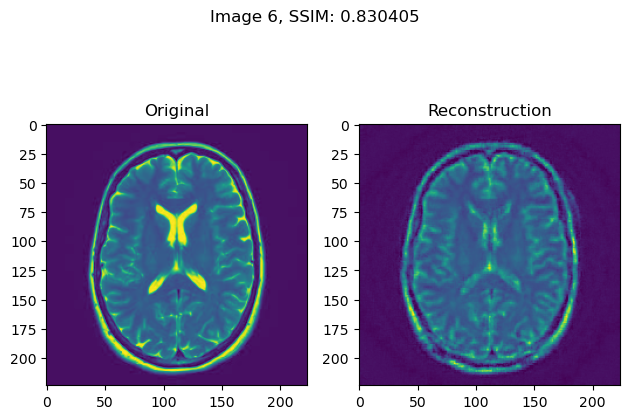

tensor([5., 2.], device='cuda:0')


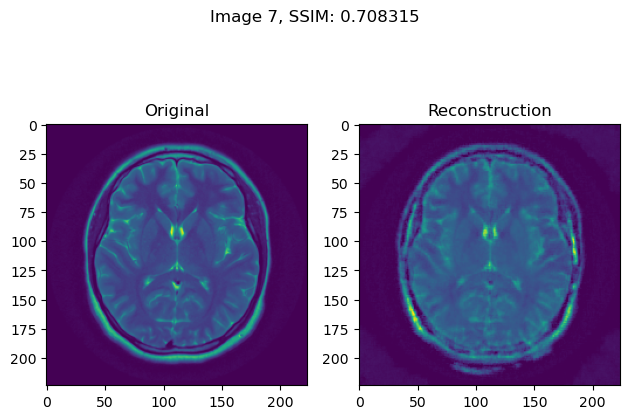

tensor([2., 3.], device='cuda:0')


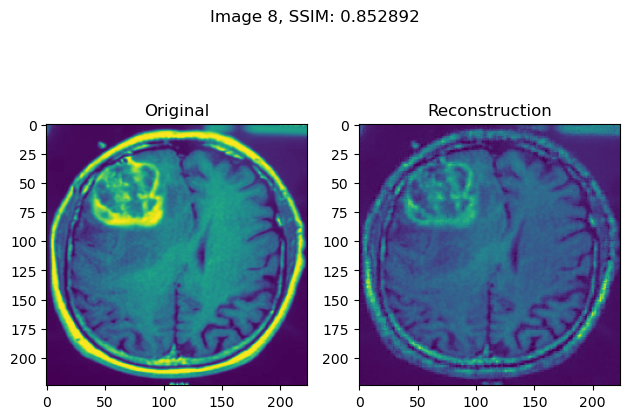

tensor([3., 2.], device='cuda:0')


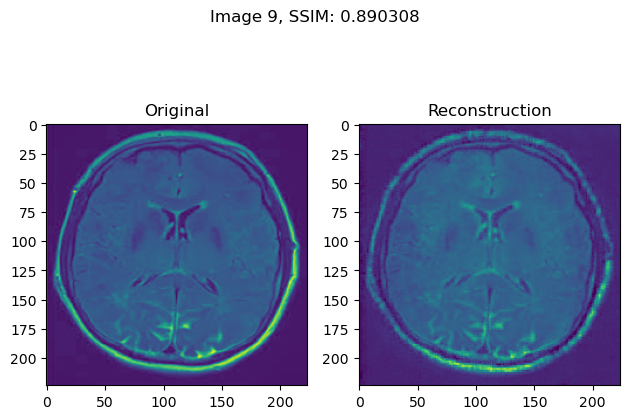

tensor([3., 0.], device='cuda:0')


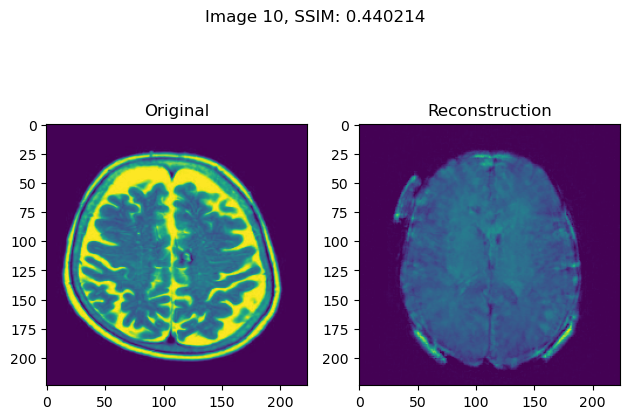

tensor([4., 0.], device='cuda:0')


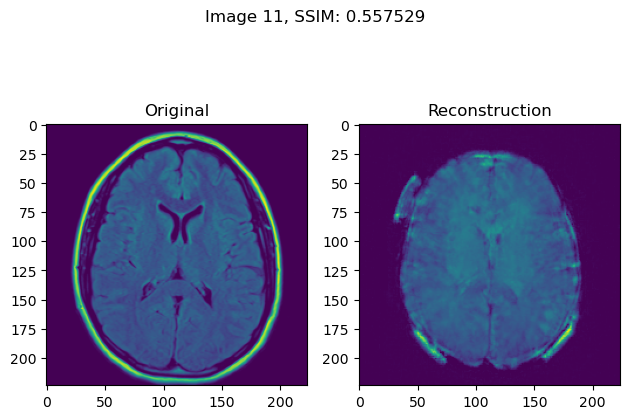

tensor([5., 0.], device='cuda:0')


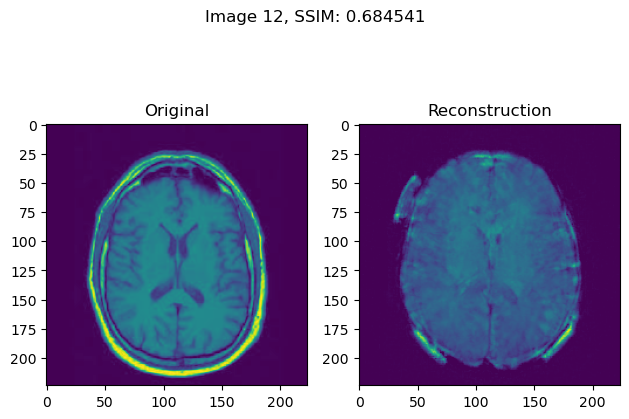

tensor([2., 4.], device='cuda:0')


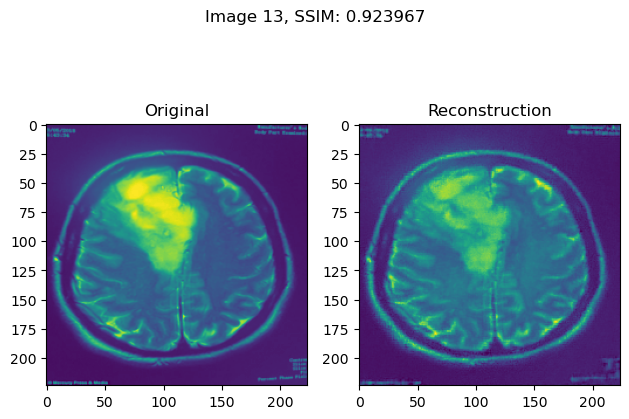

tensor([0., 4.], device='cuda:0')


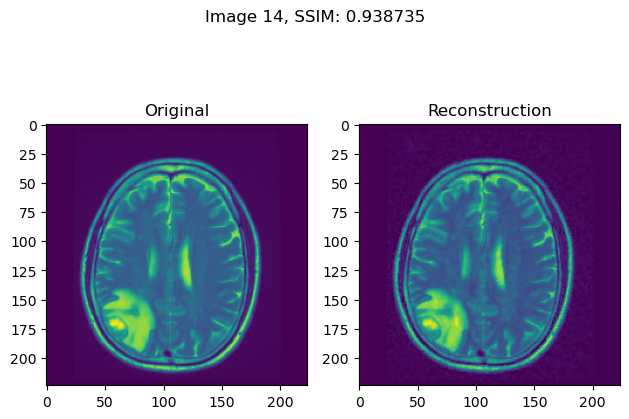

tensor([1., 4.], device='cuda:0')


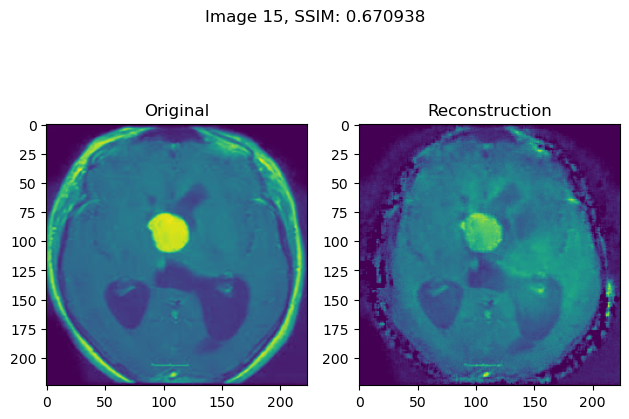

tensor([1., 5.], device='cuda:0')


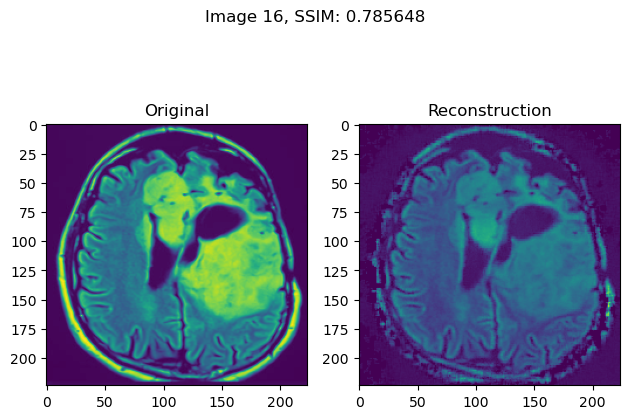

tensor([2., 5.], device='cuda:0')


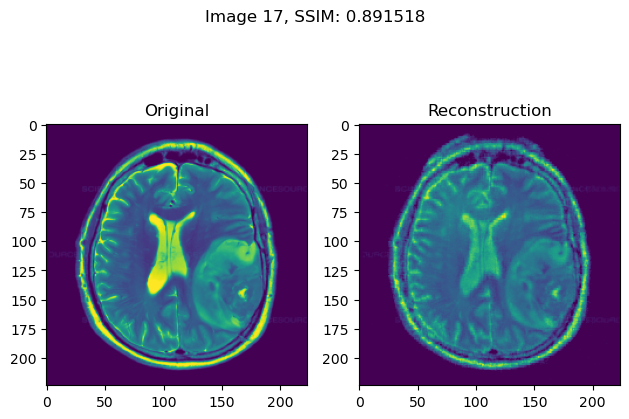

tensor([5., 1.], device='cuda:0')


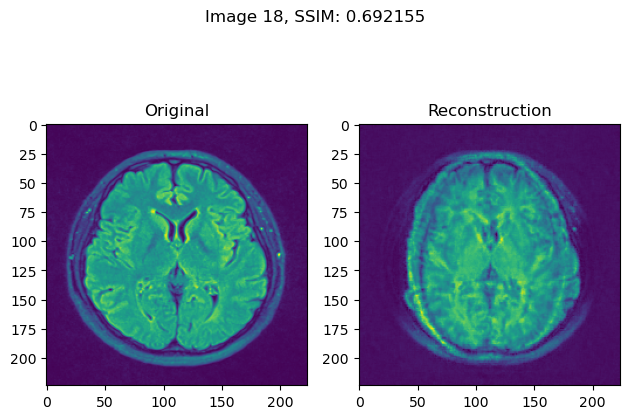

tensor([3., 1.], device='cuda:0')


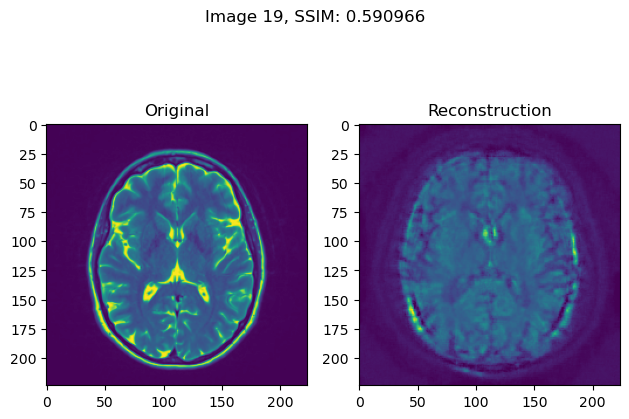

In [23]:
model.eval()
for idx, (code, _, img) in enumerate(train_mem_dataset):
    with torch.no_grad():
        rec_image = model.forward_transposed(code.view(1, -1))
        rec_image = rec_image.view(-1, 224, 224)
        rec_image = rec_image.to("cpu")
        img = img.to("cpu")
        ssim_metric = ssim(img.squeeze().numpy(), rec_image.squeeze().numpy(), multichannel=False, data_range=1.0)

        fig, ax = plt.subplots(ncols=2, tight_layout=True)
        ax[0].imshow(img.permute(1, 2, 0))
        ax[0].set_title('Original')
        ax[1].imshow(rec_image.permute(1, 2, 0))
        ax[1].set_title("Reconstruction")
        plt.suptitle("Image {}, SSIM: {:4f}".format(idx, ssim_metric))
        print(code)
        plt.show()